In [1]:
from backtest import BackTestPlot
import os
import pandas as pd
import glob
import matplotlib
import matplotlib.pyplot as plt
import evaluate
import plotly.graph_objects as go
import chart_studio.plotly as py
from copy import copy
%matplotlib inline

/home/dewe/anaconda3/envs/finrl/lib/python3.8/site-packages/pyfolio/pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
py.sign_in('ava6969', 'WD9W9LJsmNBSJTgIhh8v')

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% height:100%; !important; }</style>"))

In [4]:
files, acc_value, actions, result  = evaluate.update_data()

4it [00:03,  1.17it/s]


In [5]:
res_s = result.nlargest(20, 'Sharpe ratio')

In [6]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(res_s)

,Alpha,Annual return,Annual volatility,Beta,Calmar ratio,Cumulative returns,Daily value at risk,H_MAX,Initial Amount,Max drawdown,Omega ratio,Sharpe ratio,Sortino ratio,Stability,Tail ratio,TickTraded,checkpoint,mean_reward
3,0.0,0.455277,0.148262,1.0,5.461098,0.470524,-0.017140,3.0,25000.0,-0.083367,1.646077,2.615973,4.248922,0.845632,1.125399,AAPL,160.0,26.1161
1,0.0,0.454623,0.148210,1.0,5.454414,0.469844,-0.017135,3.0,25000.0,-0.083349,1.645425,2.613786,4.244809,0.846060,1.124128,AAPL,40.0,24.6178
2,0.0,-0.073868,0.132744,1.0,-0.322920,-0.075840,-0.016995,3.0,25000.0,-0.228750,0.903204,-0.514551,-0.748924,0.552544,1.007786,IBM,160.0,-15.0808
0,0.0,-0.074719,0.132329,1.0,-0.327769,-0.076713,-0.016947,3.0,25000.0,-0.227964,0.901606,-0.523555,-0.762156,0.555724,0.985011,IBM,40.0,0.2465


In [38]:
choice = 7

# Plot Actions and ClosePrice

In [21]:
df_action_value = copy(actions[choice])

In [22]:
df_action_value.drop('date', axis=1, inplace=True)

In [23]:
df_action_value

,actions,close_price
0,0.0,326.12
1,2.0,326.12
2,2.0,326.12
3,2.0,326.00
4,-2.0,325.74
...,...,...
115511,-2.0,504.99
115512,2.0,504.58
115513,2.0,503.51
115514,2.0,504.50


In [24]:
len(df_action_value[df_action_value.actions == 3.0])

4317

In [25]:
buys = df_action_value.loc[df_action_value['actions'] > 0]
sells = df_action_value.loc[df_action_value['actions'] < 0]

In [26]:
num_of_sells = len(sells)
f'sells {num_of_sells} times'

'sells 31958 times'

In [27]:
num_of_buys = len(buys)
f'sells {num_of_buys} times'

'sells 79945 times'

In [28]:
num_of_holds = len(df_action_value) - num_of_sells - num_of_buys
f'holds {num_of_holds} times'

'holds 3613 times'

In [29]:
# fig = go.Figure(data=go.Data(line))
import plotly.express as px
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scattergl(x=df_action_value.index.values, y=df_action_value.close_price.values, name = 'price',
                           mode='lines'))
fig.add_trace(go.Scattergl(x=buys.index, y=buys.close_price, name = 'buy signal',
                         mode='markers', marker = dict(color='green', size=5, symbol='triangle-up')))
fig.add_trace(go.Scattergl(x=sells.index, y=sells.close_price, name='sell signal',
                         mode='markers', marker = dict(color='red', size=5, symbol='triangle-down')))

fig.show()

# Backtest

In [30]:
df_account_value = acc_value[choice]
df_account_value

,date,account_value
0,2020-01-02,25091.166770
1,2020-01-03,25846.165271
2,2020-01-06,26087.807434
3,2020-01-07,27135.409554
4,2020-01-08,28181.140428
...,...,...
234,2020-11-25,165320.434399
235,2020-11-26,168728.933205
236,2020-11-27,170793.539417
237,2020-11-30,172051.876411


annual return:  926.4040037620136
sharpe ratio:  3.044417880905131
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (231, 7)


Start date,2020-01-03
End date,2020-11-30
Total months,10
,Backtest
Annual return,621.9%
Cumulative returns,479.6%
Annual volatility,78.8%
Sharpe ratio,2.91
Calmar ratio,10.58
Stability,0.87
Max drawdown,-58.8%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,52.50,2020-02-21,2020-03-19,2020-06-12,81
1,19.10,2020-09-09,2020-09-14,2020-11-30,59
3,12.18,2020-07-28,2020-08-17,2020-08-20,18
2,10.09,2020-02-05,2020-02-06,2020-02-21,13
4,6.16,2020-07-20,2020-07-22,2020-07-28,7


/home/dewe/anaconda3/envs/finrl/lib/python3.8/site-packages/pyfolio/tears.py:925: UserWarning:

Passed returns do not overlap with anyinteresting times.



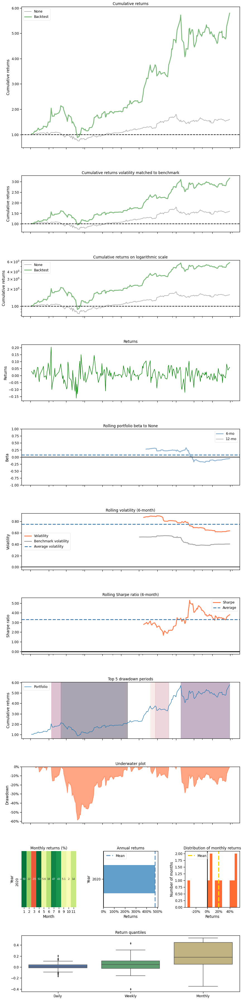

In [31]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 100em; }</style>"))
BackTestPlot(account_value=df_account_value, baseline_ticker = 'AAPL',
             baseline_start=df_account_value.iloc[0].date,
             baseline_end=df_account_value.iloc[-1].date,
            )

In [19]:
import numpy as np
k = set(result.index.to_list()) - set(result.nlargest(20, 'Sharpe ratio').index.to_list())

In [ ]:
# import os
# for i in k:
#     os.remove(files[i])